# Tutorial - importing, filtering and visualising open COVID datasets
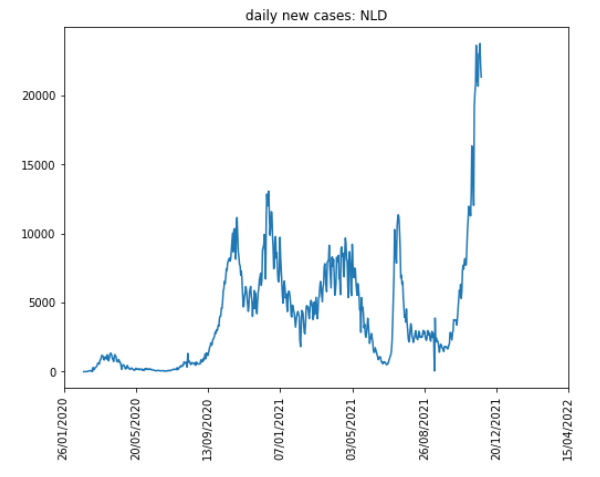

In this tutorial we will experiment with open data sources. You will learn:
* about the availability of open data - there is more than you think
* how to import a specific dataset and load it into a pandas dataframe
* how to filter pandas data frames and visualise timeseries
* how to make a time-varying geographic visualisation - the choropleth

Interesting reading:
* https://geopandas.org/docs/user_guide/mapping.html
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/TimeSliderChoropleth.ipynb

### 0. Things to install
**NB: check and update**

For this tutorial you should:

Create a new environment:

    conda create --name codinglab python=3.9
    conda activate codinglab

    conda config --add channels conda-forge 
    conda config --set channel_priority strict


Install required packages (how about branca):

    conda install gdal
    conda install geopandas
    conda install folium
    pip install descartes
    conda install jupyter

Start jupyter notebook

### 1. Searching for data
For our current tutorial lets assume the following: 

_"We wish to investigate the world wide development of the COVID-19 pandemic for ourselves. We see on the news the rise and decline of covid cases in various countries around the world. But it is hard to keep track of what is really happening. Being the inquisitive engineers that we are, we would really like to get a better insight in the global development of the pandemic. What are the developments in different countries, how do different countries compare, how did the global spread take place? Surely there must be dashboards, datasets, graphs and maps available that we can inspect."_

_**Q. Spend a few minutes on google to see if you can find some interesting resources you can explore**_

* The Johns Hopkins dashboard - https://www.arcgis.com/apps/opsdashboard/index.html#/bda7594740fd40299423467b48e9ecf6
* Overview of data sources used in the Johns Hopkins dashboard - https://github.com/CSSEGISandData/COVID-19/blob/master/README.md
* NL dashboard - https://experience.arcgis.com/experience/ea064047519040469acb8da05c0f100d
* COVID data RIVM - https://data.rivm.nl/covid-19/

_**Q. What other interesting data sources did you find? Why do you think they are of interst?**_

In [1]:
#[list some of your found resources here]

### 2. Process some data
To experiment a bit with some data processing, we look for a convenient data set to work with.

Lets look at data from "our world in data":
* https://ourworldindata.org/about
* https://ourworldindata.org/coronavirus
* https://covid.ourworldindata.org/data/owid-covid-data.csv

**_Q. Take a brief look at the following links. Do you see the different categories? Can you download data?_**

In [2]:
import datetime

import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

#### 2.1 Download the data

Define the url and use a pandas function to download the data into the notebook.

In [3]:
# define data location in a variable "data_url"
data_url = 'https://covid.ourworldindata.org/data/owid-covid-data.csv'

In [4]:
%%time

# download the csv data and put it into a pandas dataframe - this may take a few seconds
df = pd.read_csv(data_url)

CPU times: user 600 ms, sys: 168 ms, total: 768 ms
Wall time: 6.28 s


In [5]:
# inspect the created dataframe
df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156081,ZWE,Africa,Zimbabwe,2022-01-16,226078.0,441.0,594.286,5247.0,9.0,14.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
156082,ZWE,Africa,Zimbabwe,2022-01-17,226460.0,382.0,494.286,5258.0,11.0,11.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
156083,ZWE,Africa,Zimbabwe,2022-01-18,226460.0,0.0,494.286,5258.0,0.0,11.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
156084,ZWE,Africa,Zimbabwe,2022-01-19,226887.0,427.0,350.571,5266.0,8.0,7.286,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [6]:
# inspect the content
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [7]:
# inspect the content
df['iso_code'].unique()

array(['AFG', 'OWID_AFR', 'ALB', 'DZA', 'AND', 'AGO', 'AIA', 'ATG', 'ARG',
       'ARM', 'ABW', 'OWID_ASI', 'AUS', 'AUT', 'AZE', 'BHS', 'BHR', 'BGD',
       'BRB', 'BLR', 'BEL', 'BLZ', 'BEN', 'BMU', 'BTN', 'BOL', 'BES',
       'BIH', 'BWA', 'BRA', 'VGB', 'BRN', 'BGR', 'BFA', 'BDI', 'KHM',
       'CMR', 'CAN', 'CPV', 'CYM', 'CAF', 'TCD', 'CHL', 'CHN', 'COL',
       'COM', 'COG', 'COK', 'CRI', 'CIV', 'HRV', 'CUB', 'CUW', 'CYP',
       'CZE', 'COD', 'DNK', 'DJI', 'DMA', 'DOM', 'ECU', 'EGY', 'SLV',
       'GNQ', 'ERI', 'EST', 'SWZ', 'ETH', 'OWID_EUR', 'OWID_EUN', 'FRO',
       'FLK', 'FJI', 'FIN', 'FRA', 'PYF', 'GAB', 'GMB', 'GEO', 'DEU',
       'GHA', 'GIB', 'GRC', 'GRL', 'GRD', 'GTM', 'GGY', 'GIN', 'GNB',
       'GUY', 'HTI', 'OWID_HIC', 'HND', 'HKG', 'HUN', 'ISL', 'IND', 'IDN',
       'OWID_INT', 'IRN', 'IRQ', 'IRL', 'IMN', 'ISR', 'ITA', 'JAM', 'JPN',
       'JEY', 'JOR', 'KAZ', 'KEN', 'KIR', 'OWID_KOS', 'KWT', 'KGZ', 'LAO',
       'LVA', 'LBN', 'LSO', 'LBR', 'LBY', 'LIE', 'LTU', 'OWID_

#### 2.2 Add a timestamp

This is useful for plotting and sorting.

In [8]:
%%time

# create a timestamp using a for loop to get the epoch timestamp
timestamp = []
for index, row in df.iterrows():
    timestamp.append(datetime.datetime.strptime(row['date'],"%Y-%m-%d").timestamp())

df['timestamp']=timestamp  

CPU times: user 8.32 s, sys: 152 ms, total: 8.47 s
Wall time: 8.5 s


In [9]:
%%time

# create a timestamp using pandas to get a date timestamp, which you can also use for sorting 
df['datetimestamp'] = pd.to_datetime(df['date'], format="%Y-%m-%dT", errors='coerce')

CPU times: user 18.9 ms, sys: 988 µs, total: 19.9 ms
Wall time: 19.2 ms


In [10]:
# briefly display the resulting dataframe
df.head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,timestamp,datetimestamp
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN,1.582499e+09,2020-02-24
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN,1.582585e+09,2020-02-25
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN,1.582672e+09,2020-02-26
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN,1.582758e+09,2020-02-27
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN,1.582844e+09,2020-02-28


In [11]:
# inspect how we've changed the data type

print('The existing date is of type: {}'.format(type(df['date'].iloc[0])))
print('The epoch timestamp is of type: {}'.format(type(df['timestamp'].iloc[0])))
print('The datetime timestamp is of type: {}'.format(type(df['datetimestamp'].iloc[0])))

The existing date is of type: <class 'str'>
The epoch timestamp is of type: <class 'numpy.float64'>
The datetime timestamp is of type: <class 'pandas._libs.tslibs.timestamps.Timestamp'>


In [12]:
# check the time span
df['datetimestamp'].min(), df['datetimestamp'].max()

(Timestamp('2020-01-01 00:00:00'), Timestamp('2022-01-20 00:00:00'))

### 3. Filter out some country data
We extract a subset of the data by filtering on the iso_code of a country

In [13]:
# explore the dataframe (returns iso_codes if search string is in: iso_code, location or continent)
### Change here

search_string = 'lands'

###

iso_codes = df[(df['iso_code'].str.contains(search_string, case=False, regex=False)) | 
   (df['location'].str.contains(search_string, case=False, regex=False)) |
   (df['continent'].str.contains(search_string, case=False, regex=False))].iso_code.unique()

for iso in iso_codes:
    print('{}: {}'.format(iso, df[df.iso_code==iso].location.iloc[0]))

VGB: British Virgin Islands
CYM: Cayman Islands
COK: Cook Islands
FRO: Faeroe Islands
FLK: Falkland Islands
MHL: Marshall Islands
NLD: Netherlands
SLB: Solomon Islands
TCA: Turks and Caicos Islands


Let's filter from this overall data the information from the your country of choice (and put it in a new dataframe)
* Note that in the next cell you need to fill in the three letter iso code

In [14]:
### Change here

iso_code = 'NLD'

###

df_country = df[df['iso_code']==iso_code]

# show three first lines
display(df_country.head(3))

# Print some totals
print('{}, {} ({}) total cases: {:.0f}'.format(df_country['continent'].iloc[0], df_country['location'].iloc[0], df_country['iso_code'].iloc[0], np.sum(df_country['new_cases'])))
print('{}, {} ({}) total deaths: {:.0f}'.format(df_country['continent'].iloc[0], df_country['location'].iloc[0], df_country['iso_code'].iloc[0], np.sum(df_country['new_deaths'])))
print('Data recorded from {} to {}'.format(df_country['datetimestamp'].min(), df_country['datetimestamp'].max()))
        

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,timestamp,datetimestamp
100250,NLD,Europe,Netherlands,2020-02-27,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,3.32,82.28,0.944,NaN,NaN,NaN,NaN,1.582758e+09,2020-02-27
100251,NLD,Europe,Netherlands,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,3.32,82.28,0.944,NaN,NaN,NaN,NaN,1.582844e+09,2020-02-28
100252,NLD,Europe,Netherlands,2020-02-29,6.0,5.0,NaN,NaN,NaN,NaN,...,NaN,3.32,82.28,0.944,NaN,NaN,NaN,NaN,1.582931e+09,2020-02-29


Europe, Netherlands (NLD) total cases: 3729713
Europe, Netherlands (NLD) total deaths: 21265
Data recorded from 2020-02-27 00:00:00 to 2022-01-20 00:00:00


Compare the results from the Netherlands with the information from the NL dashboard:
* https://experience.arcgis.com/experience/ea064047519040469acb8da05c0f100d

**_Q. Can you match the numbers? If there is a difference, can you think of a possible explanation?_**

### 4. Now lets plot a timeseries
#### 4.1 First for just the Netherlands

In [15]:
### Change here

iso_code = 'NLD'

###

df_country = df[df['iso_code']==iso_code] = df[df['iso_code']==iso_code]

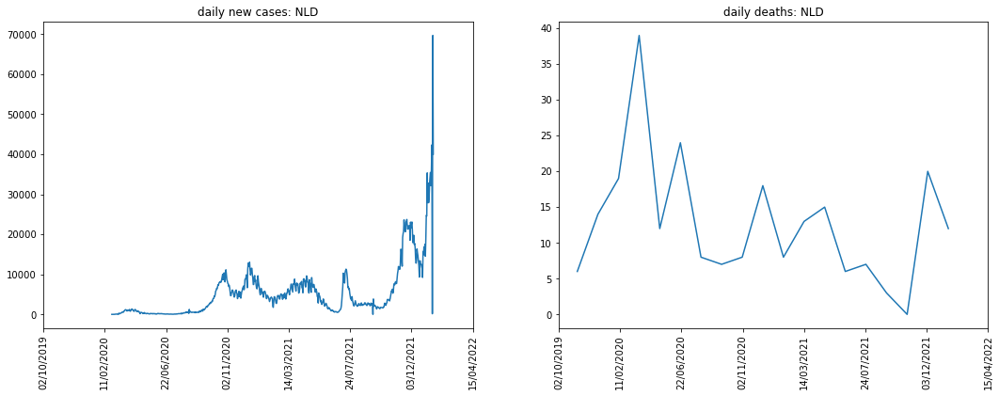

In [16]:
# generate a plot of the deaths and number of cases as a function of time
start_date = datetime.datetime(2020,1,1)
end_date = datetime.datetime.now()
fontsize = 10

# prepare the figure canvas
fig = plt.figure(figsize=(18, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# plot the data of 'new cases'
xnewcases = df_country[(df_country['datetimestamp']>=start_date) & (df_country['datetimestamp']<=end_date)]['timestamp']
ynewcases = df_country[(df_country['datetimestamp']>=start_date) & (df_country['datetimestamp']<=end_date)]['new_cases']
ax1.plot(xnewcases, ynewcases)

x_ticks = ax1.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax1.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax1.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax1.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax1.set_title('daily new cases: {}'.format(iso_code))

# plot the data of 'new deaths'
xnewdeaths = df_country[df_country['datetimestamp']>datetime.datetime(2022,1,1)]['timestamp']
ynewdeaths = df_country[df_country['datetimestamp']>datetime.datetime(2022,1,1)]['new_deaths']
ax2.plot(xnewdeaths, ynewdeaths)

x_ticks = ax2.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax2.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax2.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax2.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax2.set_title('daily deaths: {}'.format(iso_code));

#### 4.2 Now combine with another country

In [17]:
# explore the dataframe (return iso_codes if search string is in: iso_code, location or continent)
### Change here

search_string = 'unite'

###

iso_codes = df[(df['iso_code'].str.contains(search_string, case=False, regex=False)) | 
   (df['location'].str.contains(search_string, case=False, regex=False)) |
   (df['continent'].str.contains(search_string, case=False, regex=False))].iso_code.unique()

for iso in iso_codes:
    print('{}: {}'.format(iso, df[df.iso_code==iso].location.iloc[0]))

ARE: United Arab Emirates
GBR: United Kingdom
USA: United States


In [18]:
### Change here

iso_code_1 = 'NLD'
iso_code_2 = 'GBR'

###

df_1 = df[df['iso_code']==iso_code_1]
df_2 = df[df['iso_code']==iso_code_2]

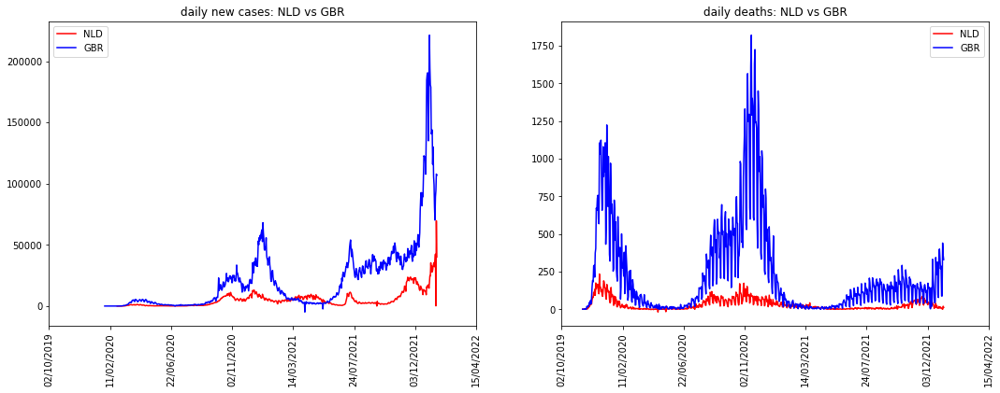

In [19]:
# generate a plot of the deaths and number of cases as a function of time
fontsize = 10

# prepare the figure canvas
fig = plt.figure(figsize=(18, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# plot the data of 'new cases'
ax1.plot(df_1['timestamp'], df_1['new_cases'], 'r', label=iso_code_1)
ax1.plot(df_2['timestamp'], df_2['new_cases'], 'b', label=iso_code_2)

x_ticks = ax1.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax1.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax1.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax1.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax1.set_title('daily new cases: {} vs {}'.format(iso_code_1, iso_code_2))

ax1.legend()

# plot the data of 'new deaths'
ax2.plot(df_1['timestamp'],df_1['new_deaths'], 'r', label=iso_code_1)
ax2.plot(df_2['timestamp'],df_2['new_deaths'], 'b', label=iso_code_2)

x_ticks = ax2.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax2.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax2.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax2.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax2.set_title('daily deaths: {} vs {}'.format(iso_code_1, iso_code_2));

ax2.legend();

**_Q. Do you feel this graph provides a useful comparison? Can you think of ways to make the data more comparable_**

### 5. Plot results on the map (we use the TimeSliderChoropleth)
Interesting reading
* https://towardsdatascience.com/visualizing-air-pollution-with-folium-maps-4ce1a1880677
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/TimeSliderChoropleth.ipynb

In [20]:
import folium
from folium.plugins import TimeSliderChoropleth

from branca.colormap import linear

In [21]:
# method to normalise values-to-plot for application of the colormap
def norm(x):
    return (x - x.min()) / (x.max() - x.min())

#### Get the data

In [22]:
# for the choropleth we need to remove NaN's from the original data, we change them to zero's
df = df.fillna(0)
df.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,timestamp,datetimestamp
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.0,0.0,0.0,0.0,...,37.746,0.5,64.83,0.511,0.0,0.0,0.0,0.0,1.582499e+09,2020-02-24
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.0,0.0,0.0,0.0,...,37.746,0.5,64.83,0.511,0.0,0.0,0.0,0.0,1.582585e+09,2020-02-25
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.0,0.0,0.0,0.0,...,37.746,0.5,64.83,0.511,0.0,0.0,0.0,0.0,1.582672e+09,2020-02-26


In [23]:
# get a geopandas dataframe with polygons of all countries in the world
gp_df_world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gp_df_world.head(3)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."


#### Create style dict

In [24]:
# select a colormap (and apply a scale)

### Change here

min_value = 1
max_value = 0.75*np.max(df.new_deaths)

###

cmap = linear.PuRd_09.scale(min_value, max_value)

In [25]:
# generate styledata (for each country collect the selected data (here new_deaths), set a color and opacity) 
styledata = {}
for index in gp_df_world.index:
    df_2 = pd.DataFrame(
        {'color': df[df['iso_code']==gp_df_world[gp_df_world.index==index]['iso_a3'].item()].sort_values(by='timestamp', ascending=True)['new_deaths'].apply(cmap).values,
         'opacity': (norm(df[df['iso_code']==gp_df_world[gp_df_world.index==index]['iso_a3'].item()].sort_values(by='timestamp', ascending=True)['new_deaths']).values)*0+.9},
         index=(df[df['iso_code']==gp_df_world[gp_df_world.index==index]['iso_a3'].item()].sort_values(by='timestamp', ascending=True)['timestamp'].values).astype('U10')
    )
    styledata[index] = df_2

In [26]:
# transform the styledata to a styledict (this is what the TimeSliderChoropleth expects)
styledict = {
    str(country): data.to_dict(orient='index') for
    country, data in styledata.items()
}

#### Generate the TimeSliderChoropleth visualisation using Folium

In [27]:
# Create a basic folium map
covid_world_map = folium.Map([20, 20], zoom_start=2)

In [28]:
# Create and add a slide object
g = TimeSliderChoropleth(
    gp_df_world.to_json(),
    styledict=styledict,
).add_to(covid_world_map)

covid_world_map

#### Save plot as html file

In [29]:
covid_world_map.save('covid_world_map.html')

**_Q. Does this visualisation help you to gain insight in the spread of the pandemic?_** 

**_Q. Can you make a similar map for just the Netherlands?_** 

Tip: 
* look at the RIVM data per municipality (https://data.rivm.nl/covid-19/COVID-19_aantallen_gemeente_per_dag.csv)
* look at the CBS geometries per municipality
* indexes can be matched on 'Municipality_name' and 'statnaam' or 'Municipality_code' and 'statcode'

In [30]:
data_url_aantallen = 'https://data.rivm.nl/covid-19/COVID-19_aantallen_gemeente_per_dag.csv'

In [31]:
%%time

# download the csv data and put it into a pandas dataframe - this may take a few seconds
df_aantallen = pd.read_csv(data_url_aantallen, sep=';')
df_aantallen.head(2)

CPU times: user 388 ms, sys: 116 ms, total: 504 ms
Wall time: 1min 30s


,Version,Date_of_report,Date_of_publication,Municipality_code,Municipality_name,Province,Security_region_code,Security_region_name,Municipal_health_service,ROAZ_region,Total_reported,Deceased
0,3,2022-01-20 10:00:00,2020-02-28,GM0014,Groningen,Groningen,VR01,Groningen,GGD Groningen,Acute Zorgnetwerk Noord Nederland,0,0
1,3,2022-01-20 10:00:00,2020-02-28,GM0034,Almere,Flevoland,VR25,Flevoland,GGD Flevoland,SpoedZorgNet,0,0


In [32]:
geodata_url = "https://geodata.nationaalgeoregister.nl/cbsgebiedsindelingen/wfs?request=GetFeature&service=WFS&version=2.0.0&typeName=cbs_gemeente_2017_gegeneraliseerd&outputFormat=json"
gemeentegrenzen = gpd.read_file(geodata_url)
gemeentegrenzen.head(2)

,id,statcode,statnaam,jrstatcode,rubriek,geometry
0,cbs_gemeente_2017_gegeneraliseerd.227606,GM0003,Appingedam,2017GM0003,gemeente,"MULTIPOLYGON (((254580.674 594573.506, 254603...."
1,cbs_gemeente_2017_gegeneraliseerd.227607,GM0005,Bedum,2017GM0005,gemeente,"MULTIPOLYGON (((235432.131 595115.625, 236140...."


<AxesSubplot:>

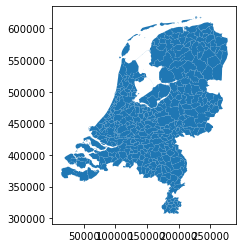

In [33]:
gemeentegrenzen.plot()

### 6. Options for further study
* We now looked at a global data set and we visualised the results aggregated per country. Perhaps you can try to make a similar plot but now per Dutch province, or municipality.
  * Tip: for COVID data you may look at https://data.rivm.nl/covid-19/, for plotting choropleths on province or municipality level you may look at https://www.cbs.nl/en-gb/onze-diensten/open-data/statline-as-open-data/cartography (select Python)
* The total number of new cases and new deaths may be a bit misleading. Larger countries may have larger totals, whereas the number of cases and deaths as a proportion of the population may be the same or lower. Consider how you would come up with different indicators.

#### 6.1 Number of tests vs number of cases
How many tests are done per day, and how many of those tests then result in positive cases

In [34]:
# define data location in a variable "data_url"
data_url_testen = 'https://data.rivm.nl/covid-19/COVID-19_uitgevoerde_testen.csv'

In [35]:
%%time

# download the csv data and put it into a pandas dataframe - this may take a few seconds
df_testen = pd.read_csv(data_url_testen, sep=';')

# add a timestamp column for the convenience of plotting
df_testen['timestamp']=pd.to_datetime(df_testen['Date_of_statistics']).astype('int64')//1e9

CPU times: user 331 ms, sys: 104 ms, total: 436 ms
Wall time: 1min 15s


<timed exec>:5: FutureWarning: casting datetime64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.


In [36]:
df_testen.head()

,Version,Date_of_report,Date_of_statistics,Security_region_code,Security_region_name,Tested_with_result,Tested_positive,timestamp
0,2,2022-01-20 09:00:00,2020-06-01,VR01,Groningen,3,0,1.590970e+09
1,2,2022-01-20 09:00:00,2020-06-02,VR01,Groningen,210,0,1.591056e+09
2,2,2022-01-20 09:00:00,2020-06-03,VR01,Groningen,209,0,1.591142e+09
3,2,2022-01-20 09:00:00,2020-06-04,VR01,Groningen,245,1,1.591229e+09
4,2,2022-01-20 09:00:00,2020-06-05,VR01,Groningen,227,0,1.591315e+09


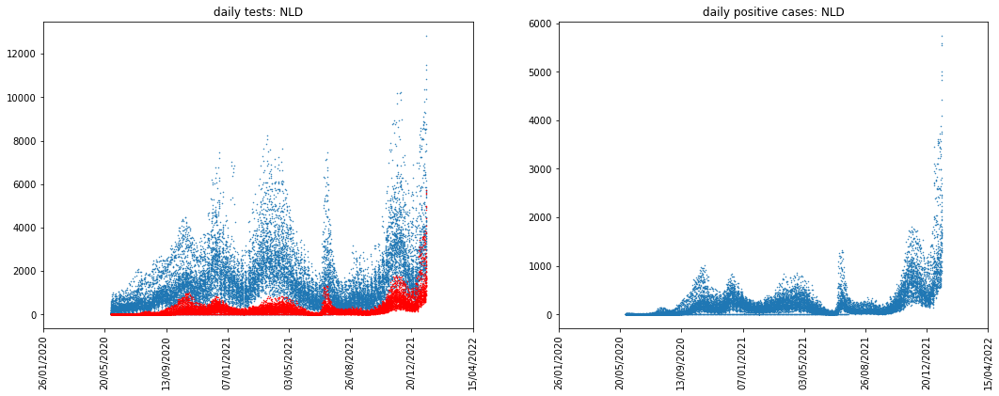

In [37]:
# generate a plot of the deaths and number of cases as a function of time
fontsize = 10

# prepare the figure canvas
fig = plt.figure(figsize=(18, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# plot the data of 'new cases'
ax1.plot(df_testen['timestamp'], df_testen['Tested_with_result'],'.', markersize=1)
ax1.plot(df_testen['timestamp'],df_testen['Tested_positive'],'.r', markersize=1)

x_ticks = ax1.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax1.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax1.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax1.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax1.set_title('daily tests: {}'.format(iso_code))

# plot the data of 'new deaths'
ax2.plot(df_testen['timestamp'],df_testen['Tested_positive'],'.', markersize=1)

x_ticks = ax2.get_xticks()
x_ticks = np.linspace(min(x_ticks), max(x_ticks), 8)
ax2.set_xticks([x for x in x_ticks])

x_ticks = ax1.get_xticks()
ax2.set_xticklabels([datetime.datetime.fromtimestamp(x).strftime("%d/%m/%Y") for x in x_ticks]);
ax2.tick_params(axis="x", labelrotation=90, labelsize=fontsize)

ax2.set_title('daily positive cases: {}'.format(iso_code));